# Import

In [1]:
import sys
sys.path.append("..")

from src.data import CrossSimilarityDataset
from src.utils import plot_cross_similarity
from src.transforms import RandomJumps
from src.asap import load_annotations, ASAPWrapper
from src.dcnn import DCNN

import os
from tqdm import tqdm

import numpy as np
from torch.utils.data import DataLoader
from torchvision.transforms.v2 import Resize
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# Load dataset

In [3]:
# Path to the clonned ASAP repository

asap_dir = "../../asap-dataset"

In [4]:
asap_wrapper = ASAPWrapper(asap_dir, val_ratio=0.2, random_seed=42)

In [5]:
print(f'Number of performances in train: {len(asap_wrapper.train_paths)}')
print(f'Number of performances in val: {len(asap_wrapper.val_paths)}')

Number of performances in train: 793
Number of performances in val: 243


In [6]:
img_size = 1024
fs = 10 # Sampling frequency
transform = Resize((img_size, img_size))
min_num_jumps = 0
max_num_jumps = 3
jumps_transform = RandomJumps(fs, min_num_jumps=min_num_jumps, max_num_jumps=max_num_jumps, max_silence_s=8.)

train_dataset = CrossSimilarityDataset(asap_wrapper.train_paths,
                                       fs,
                                       transform,
                                       structural_transform=jumps_transform,
                                       inference_only=False)

val_dataset = CrossSimilarityDataset(asap_wrapper.val_paths,
                                     fs,
                                     transform,
                                     structural_transform=jumps_transform,
                                     inference_only=False)

In [7]:
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)

val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)

/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(anti

torch.Size([16, 1, 1024, 1024])
torch.Size([16, 6, 2])


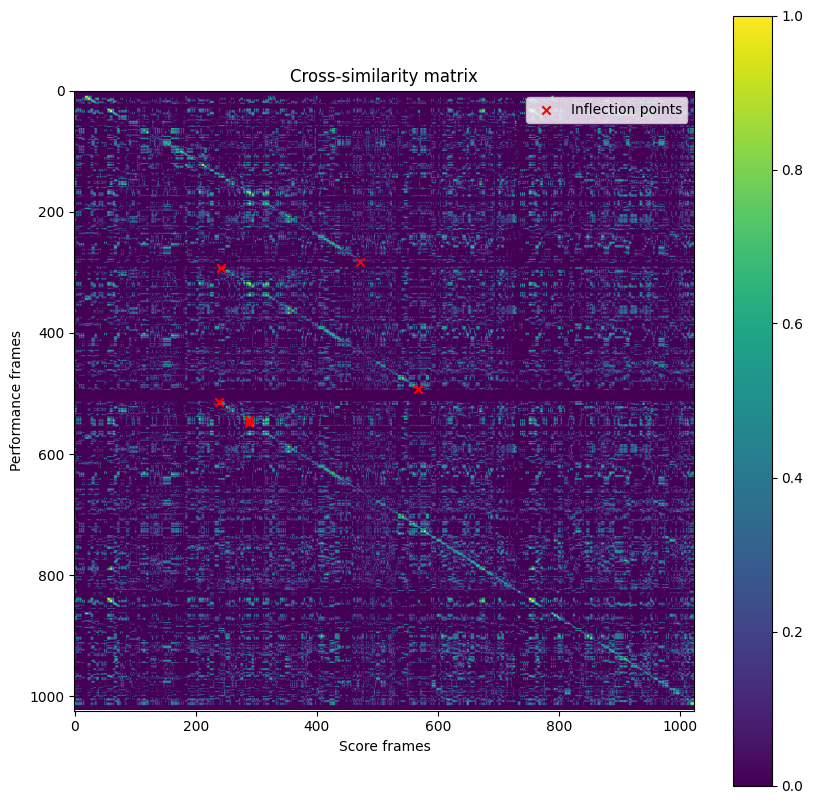

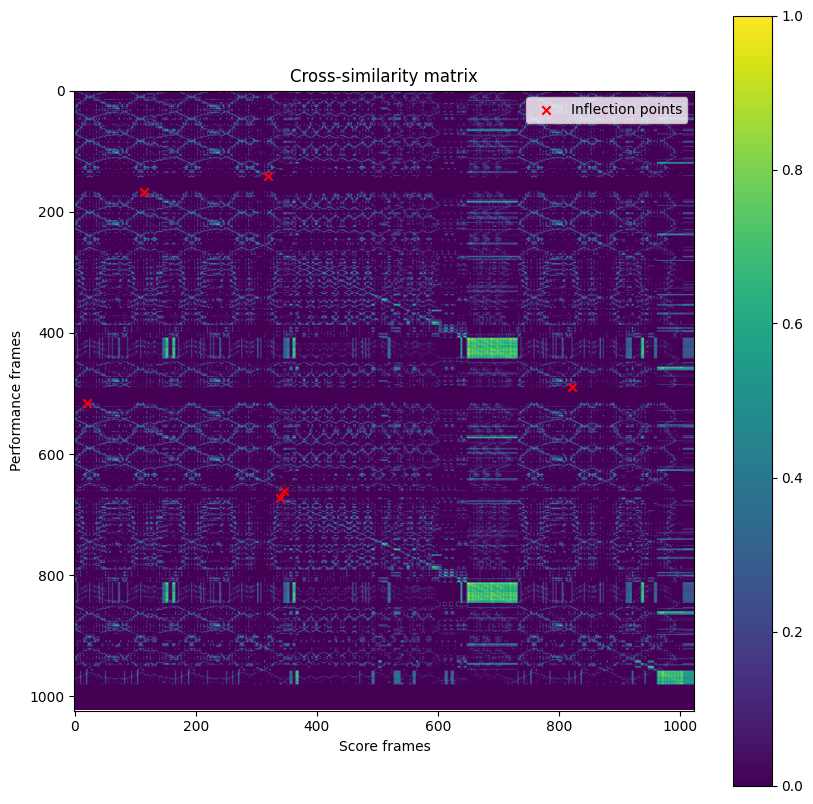

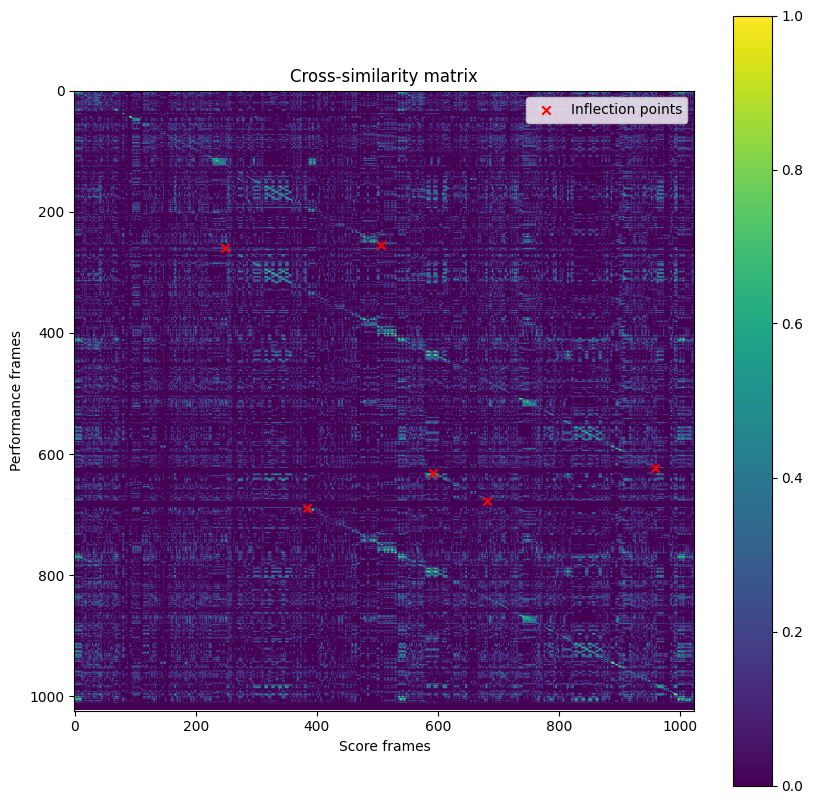

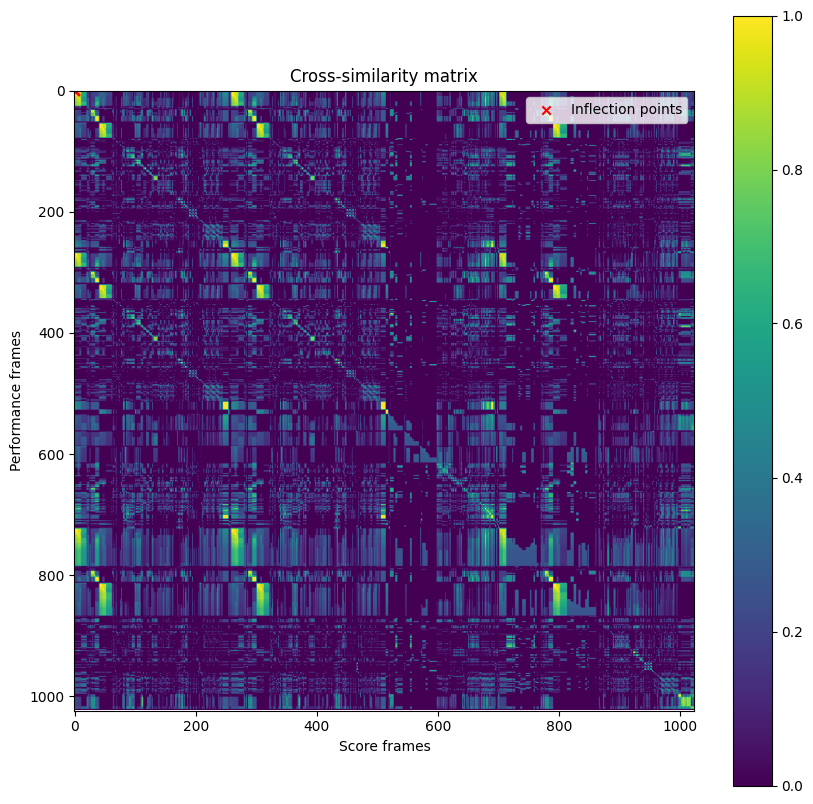

In [8]:
for batch in train_loader:
    x = batch['image']
    target = batch['target']
    for i in range(4):
        plot_cross_similarity(x[i],
                              beat_alignment=None,
                              inflection_points=target[i])
    print(x.shape)
    print(target.shape)
    break

# Model

In [9]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.optim import Optimizer


class Trainer:
    """Model trainer."""

    def __init__(self,
                 train_loader: DataLoader,
                 val_loader: DataLoader,
                 num_epochs: int,
                 optimizer: Optimizer,
                 device: str):
        """Initializes an instance of Trainer.

        Args:
            train_loader: Train set data loader.
            val_loader: Val set data loader.
            num_epochs: The number of epochs.
            optimizer: Optimizer.
            device: Device.
        """
        self.criterion = nn.MSELoss()
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.num_epochs = num_epochs
        self.optimizer = optimizer
        self.device = device

    def _train_epoch(self, model: nn.Module) -> float:
        """One epoch pass."""
        epoch_loss = 0
        model.train()
        for batch in tqdm(self.train_loader):
            self.optimizer.zero_grad()
            x = batch['image'].to(self.device)
            y_true = batch['target'].to(self.device)

            y_pred = model(x)
            loss = self.criterion(y_pred, y_true)
            loss.backward()
            self.optimizer.step()
            epoch_loss += loss.item()
        return epoch_loss

    @torch.no_grad
    def _validate(self, model: nn.Module) -> float:
        """Validation."""
        val_loss = 0
        model.eval()
        for batch in tqdm(self.val_loader):
            x = batch['image'].to(self.device)
            y_true = batch['target'].to(self.device)

            y_pred = model(x)
            loss = self.criterion(y_pred, y_true)
            val_loss += loss.item()
        return val_loss

    def train(self, model: nn.Module) -> None:
        """Trains a DCNN model.

        Args:
            model: DCNN model.
        """
        for epoch in range(self.num_epochs):
            train_loss = self._train_epoch(model)
            print(f"Epoch: {epoch}, Train loss: {train_loss}")
            val_loss = self._validate(model)
            print(f"Epoch: {epoch}, Val loss: {val_loss}")

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [11]:
model = DCNN(1024, [1, 1, 1], max_num_jumps * 2).to(device)

In [12]:
from torch.optim import Adam

optimizer = Adam(model.parameters(), lr=1e-3)

num_epochs = 1

In [13]:
trainer = Trainer(train_loader,
                  val_loader,
                  num_epochs,
                  optimizer,
                  device)

In [15]:
trainer.train(model)

  0%|          | 0/52 [00:00<?, ?it/s]/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: upda

Epoch: 0, Train loss: 10.58517038077116


  0%|          | 0/14 [00:00<?, ?it/s]/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: upda

Epoch: 0, Val loss: 1.6900553777813911


/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/dmgvrlv/miniconda3/envs/dcnn/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(anti

torch.Size([16, 1, 1024, 1024])
torch.Size([16, 6, 2])


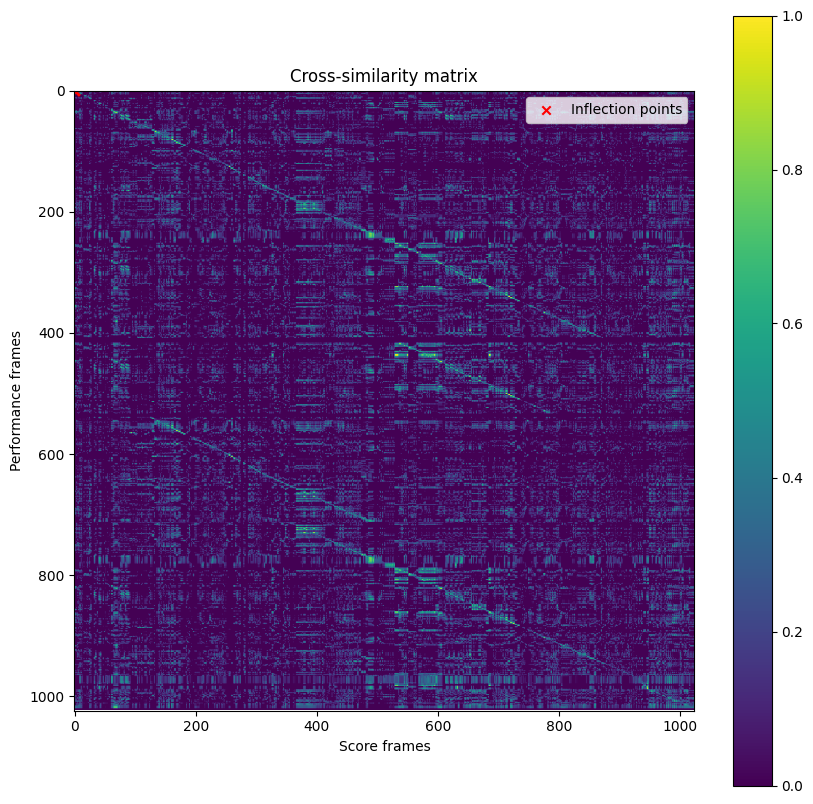

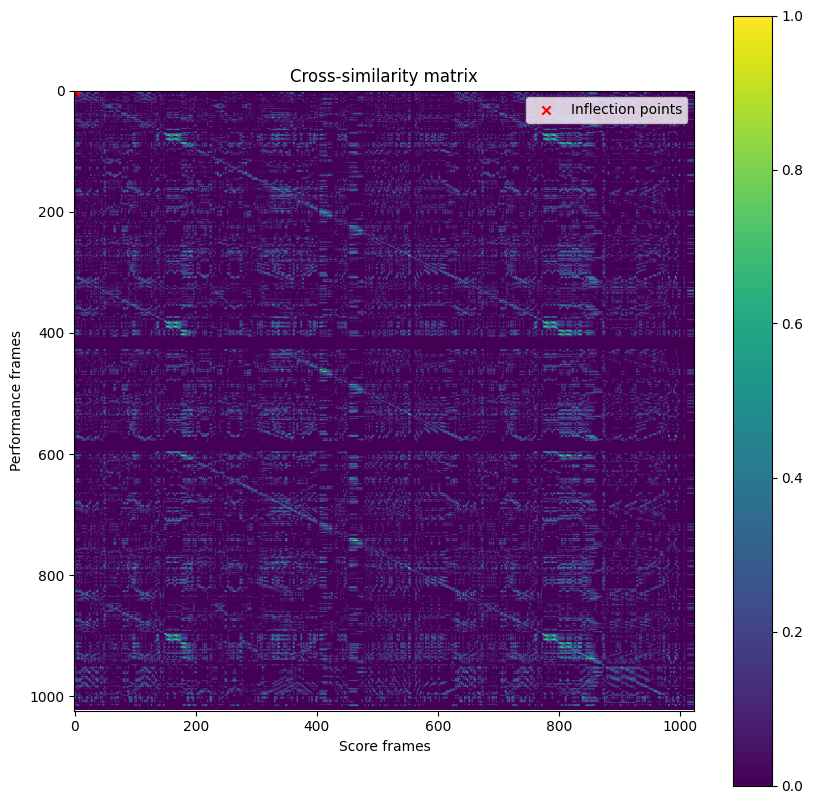

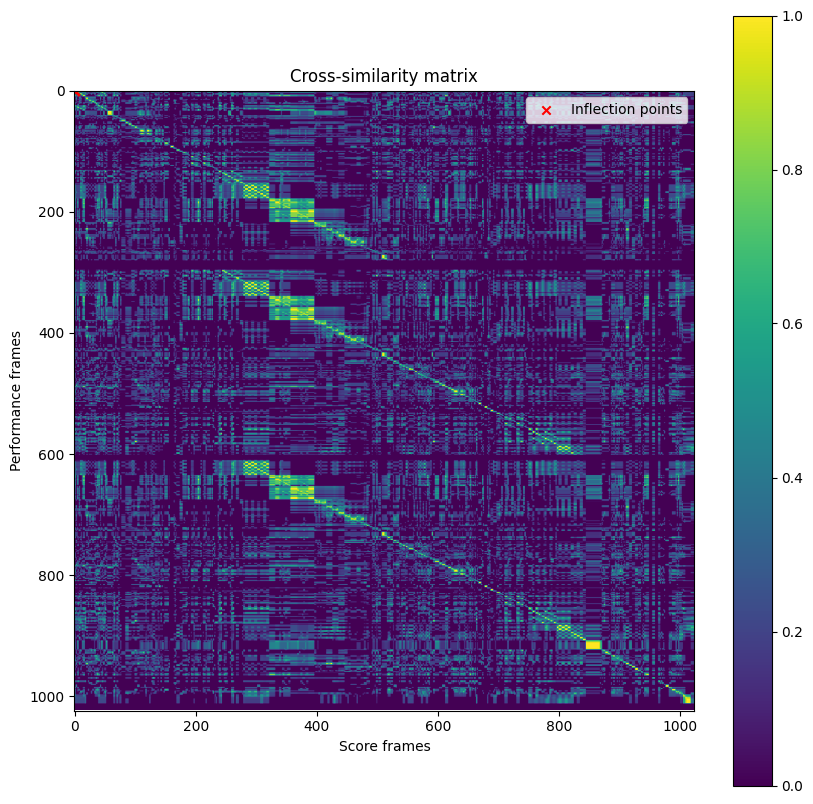

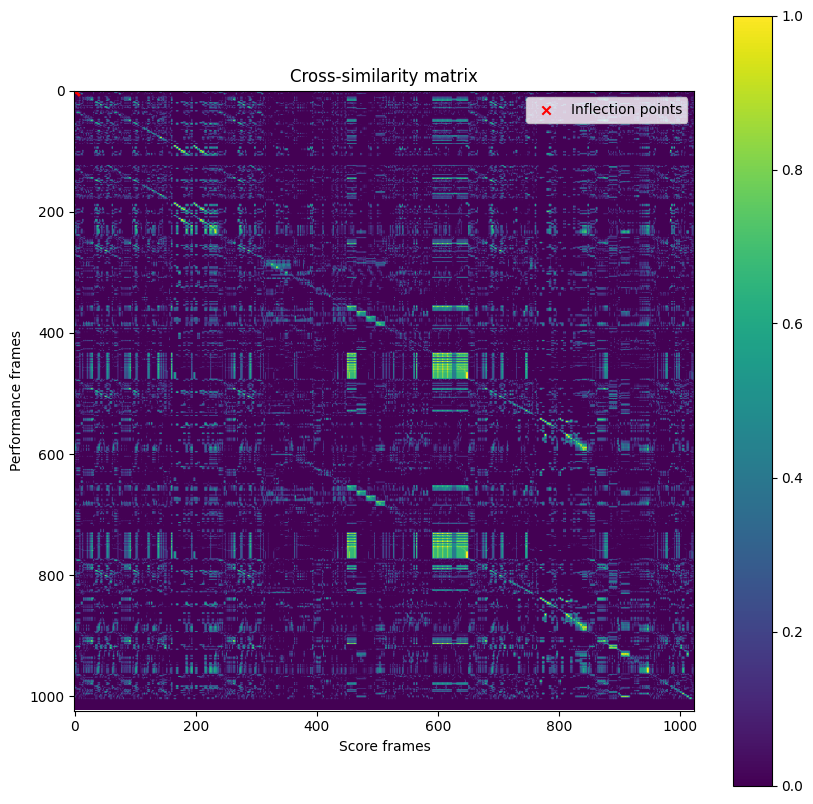

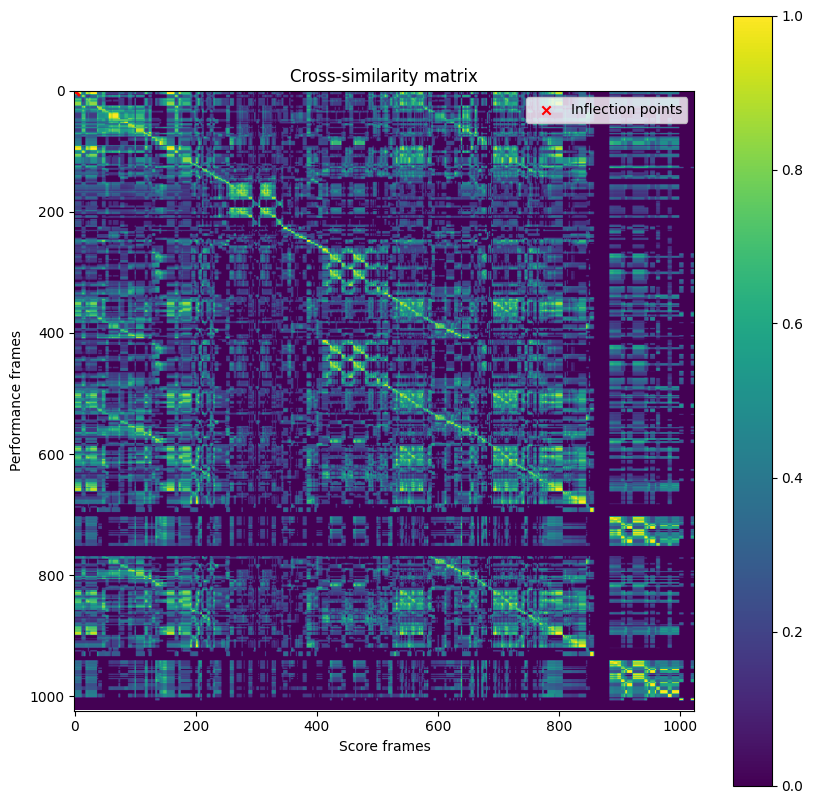

...

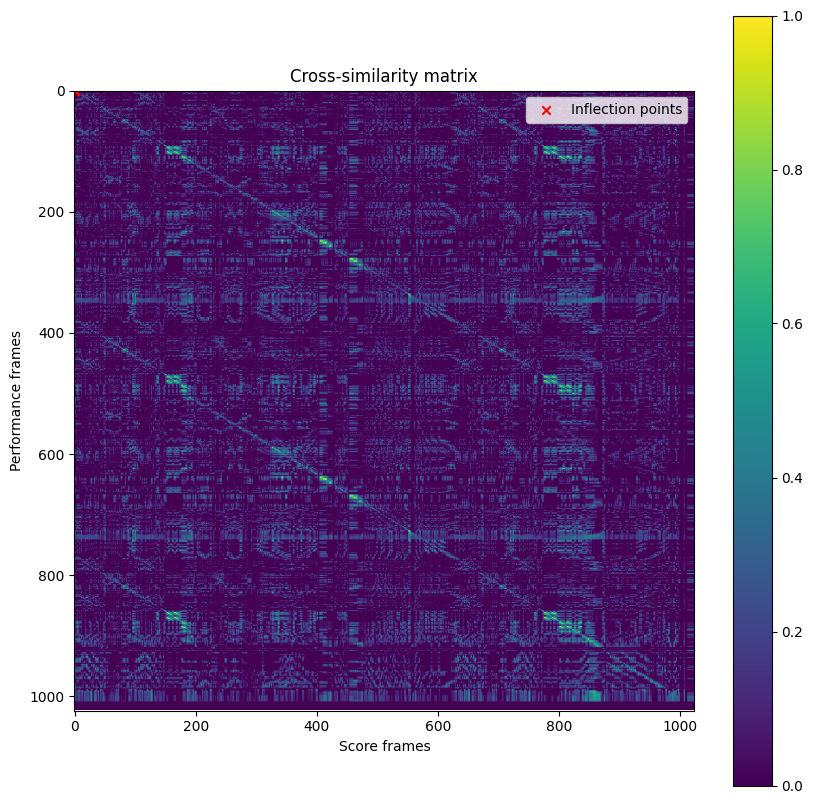

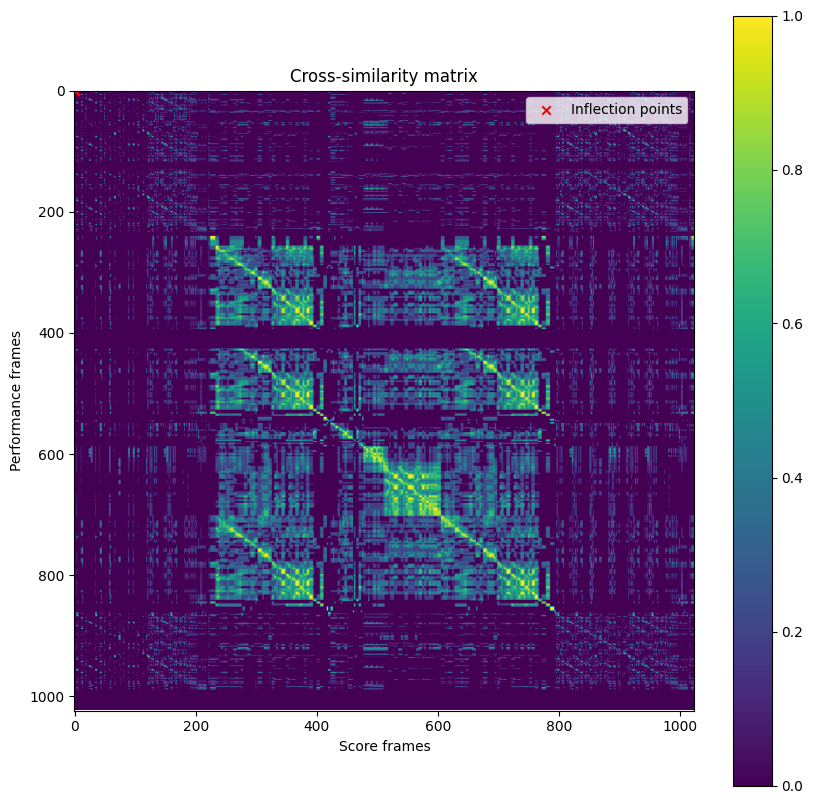

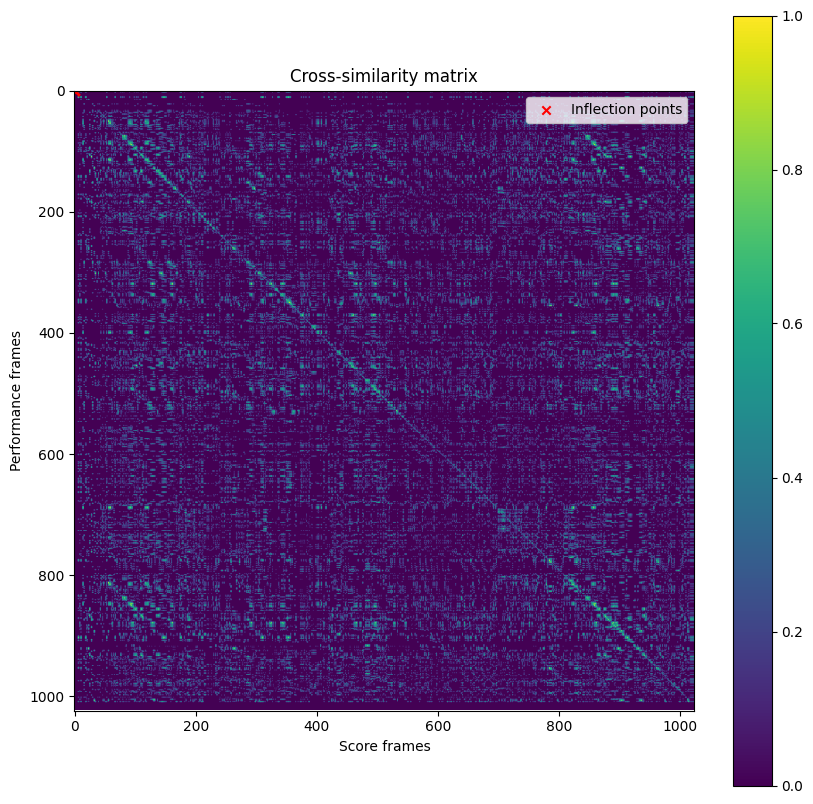

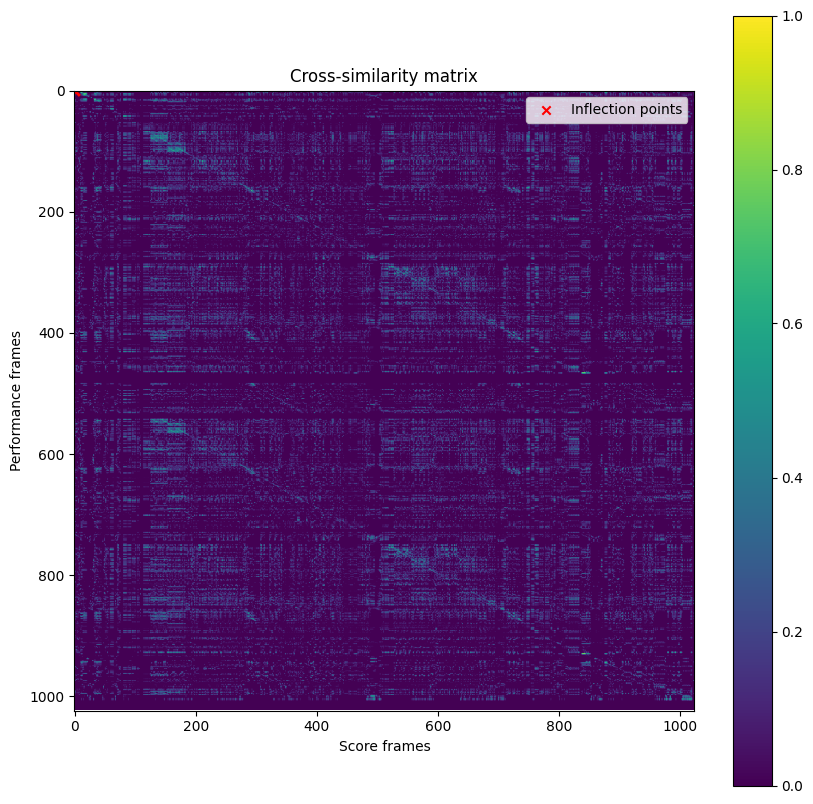

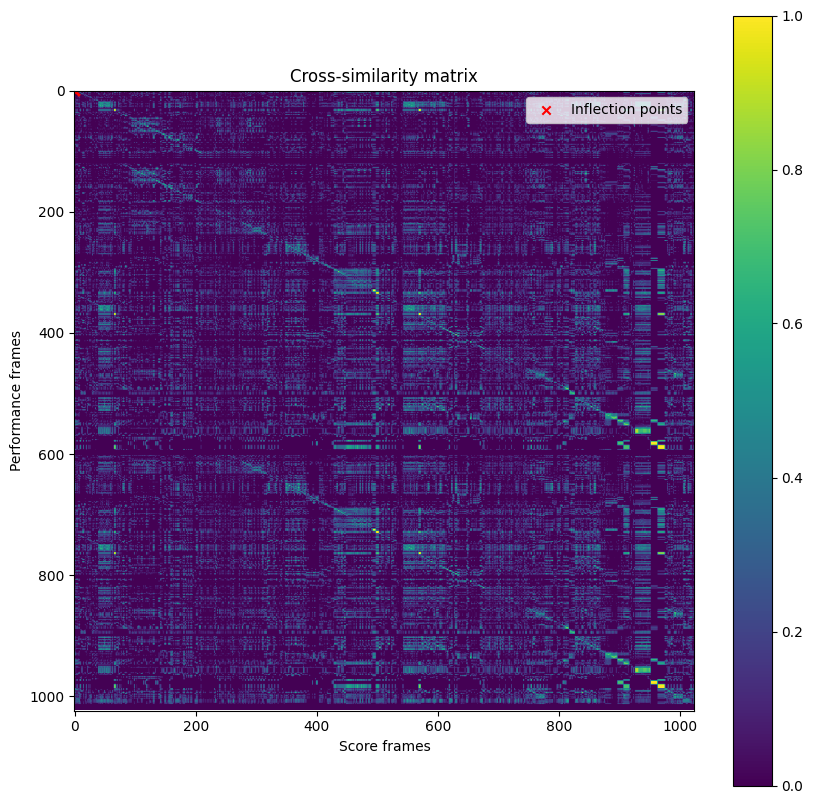

In [16]:
for batch in train_loader:
    x = batch['image'].to(device)
    y_true = batch['target'].to(device)
    model.eval()
    with torch.no_grad():
        y_pred = model(x).cpu()
    x = x.cpu()
    for i in range(len(x)):
        plot_cross_similarity(x[i],
                              beat_alignment=None,
                              inflection_points=y_pred[i])
    print(x.shape)
    print(target.shape)
    break

In [17]:
y_pred

tensor([[[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0.]],

        [[0., 0.],
         [0., 0.],
         [0., 0.],
         [0., 0